# ⚫ ECCV 2025 Tutorial – Feature Representations, Then and Now
<!-- Student numbers: <span style="color:red">r1024617, r1028141, r1017287, r0928156, r1016565</span>. -->

Welcome to our hands-on tutorial on **feature representations in computer vision**, presented at **ECCV 2025**!  
We are a team of computer vision researchers from different corners of the **Mediterranean Sea** — and together, we form the **Mediterranean Vision** research group.

To make this as practical and engaging as possible, we’ve designed this tutorial around a real-world challenge:  
**A Kaggle competition**, where the goal is to build a classifier that can recognize three celebrities from facial images.


<hr>

## ➤ What You Will Learn

This notebook is designed for **students** who are new to the field or looking to solidify their understanding of how features are constructed and used in visual recognition tasks.  
By following this notebook, you will:

- Understand how to **extract and preprocess faces** from raw images.
- Compare **classical handcrafted features** (like PCA and HOG) with modern alternatives.
- Visualize how different feature spaces separate facial identities.
- Train and evaluate different **machine learning classifiers** on top of your features.
- Submit predictions and measure your performance on a real test set.
- And finally — engage with **modern techniques** such as **transfer learning**, and learn how to **adapt pretrained neural networks** to specialized tasks like face recognition.

<hr>

## ➤ Why Feature Representations?

Feature engineering has always been at the core of computer vision. While today’s deep learning models learn features automatically, understanding **what makes a good feature** is still essential. It enables us to interpret and debug models more effectively, design compact and resource-efficient systems for constrained environments, and fully understand the evolution of visual recognition pipelines over time.

In this tutorial, you’ll experience this journey firsthand — from classical feature descriptors to more modern deep learning embeddings — and build a full face recognition pipeline along the way.

<hr>

## ➤ Notebook Structure 📄

Throughout this tutorial, you will work through a complete face recognition pipeline, broken down into clear and progressive stages:

1. **Setup and Data Loading**  
   We begin by installing dependencies, importing libraries, and downloading the dataset using the Kaggle API.

2. **Data Exploration and Preprocessing**  
   Next, we explore the dataset to understand its structure, inspect class distributions, and apply MTCNN to extract faces from the raw images.

3. **Feature Representations**  
   In this core section, we experiment with classical feature extraction techniques such as PCA and HOG. We also visualize how these representations capture facial differences and their effectiveness for recognition.

4. **Classifier Training and Evaluation**  
   With features in hand, we train a series of machine learning classifiers including SVM, AdaBoost, and SGD. We evaluate their performance using appropriate metrics and validate our design choices.

5. **Transfer Learning and Deep Representations** *(optional advanced section)*  
   For those interested in modern approaches, we introduce how to apply pretrained convolutional neural networks to face recognition and adapt them to our dataset using transfer learning techniques.

6. **Submission and Results**  
   We prepare model predictions on the test set and generate a valid submission for the Kaggle leaderboard.

7. **Discussion and Takeaways**  
   Finally, we reflect on the pipeline, compare the effectiveness of different feature types, and discuss lessons learned about designing recognition systems.

<br>
<hr>

### Let’s get started! 🔍


<br>

#### ➜ Installing Required Packages

Before diving into feature extraction and face recognition, we need to ensure that all necessary Python libraries are available in our environment.

This includes:

- **NumPy**, **Pandas** and **Matplotlib** for data handling and visualization.
- **OpenCV** for image processing and computer vision operations.
- **Seaborn** for enhanced statistical data visualization.
- **scikit-learn** for machine learning models and feature extraction techniques like PCA.
- **Pillow** for basic image manipulation (e.g. resizing)
- **MTCNN** (Multi-task Cascaded Convolutional Networks) for face detection.
- **TensorFlow**  for deep learning facial recognition.
- **Kaggle API** to download the dataset directly from the competition page.

<br>

> 💡 These installations may take a minute. If you're running this notebook on Kaggle or Google Colab, the environment should support these installations by default or install them quickly.


With the required packages installed, we now import the key libraries that will be used throughout the notebook.
> 📁 This notebook runs in a pre-configured Python 3 environment (based on the [Kaggle Docker image](https://github.com/kaggle/docker-python)), which comes with many of these libraries already installed.

> 🔍 These imports form the backbone of the face recognition pipeline you'll build, from raw image loading to feature extraction and model evaluation.

In [1]:
!pip install scikit-image seaborn mtcnn xgboost facenet-pytorch tqdm kaggle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 89.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 90.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 75.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.

In [2]:
import io # Input/Output Module
import os # OS interfaces
import cv2 # OpenCV package
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.preprocessing import StandardScaler
from urllib import request # module for opening HTTP requests
from matplotlib import pyplot as plt # Plotting library
from PIL import Image # Resizing of images
from sklearn.decomposition import PCA # For PCA Analysis


---------------------------------------------------------------
# 0. Data Loading and Preprocessing

Before we can begin extracting features or training models, we first need to load the dataset and understand what we're working with.
##  0.1 Loading the Data

You might notice that the **training set is much smaller than the test set**. While this may seem counterintuitive, it's actually quite common in real-world applications: your system might be trained on limited examples, but expected to operate at scale through daily use, making predictions on new inputs every day.

In this session, we embrace this challenge and aim to build the most effective face recognition pipeline we can — working with the data we've got.

> Keep in mind: the quality of your preprocessing and features can matter even more when data is scarce.


> ℹ️ **Note:** This dataset is a curated subset of the [VGG Face Dataset](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/), a large-scale collection of face images widely used for research in face recognition.

## 0.2. A first look
Before diving into preprocessing or modeling, it's important to develop an understanding of the data. In this section, we'll inspect the structure of both the training and test sets, examine the key columns, and visualize the distribution of classes.

In [3]:
# Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    '/kaggle/input/kul-computer-vision-ga-1-2025/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    '/kaggle/input/kul-computer-vision-ga-1-2025/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-computer-vision-ga-1-2025/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-computer-vision-ga-1-2025/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]
  

train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

In [4]:
# The training set contains an identifier, name, image information and class label
train.head(1)

,name,class,img
id,,,
0,Mila_Kunis,2,"[[[50, 31, 25], [49, 30, 24], [49, 30, 24], [4..."


In [5]:
# The test set only contains an identifier and corresponding image information.

test.head(1)

,img
id,
0,"[[[209, 210, 205], [208, 209, 204], [208, 209,..."


In [6]:
# The class distribution in the training set:
train.groupby('name').agg({'img':'count', 'class': 'max'})

,img,class
name,,
Jesse_Eisenberg,30,1
Michael_Cera,10,0
Mila_Kunis,30,2
Sarah_Hyland,10,0


Note that **Jesse is assigned the classification label 1**, and **Mila is assigned the classification label 2**. The dataset also contains 20 images of **look alikes (assigned classification label 0)** and the raw images.

## 0.3. Preprocess data
### 0.3.1 Example: Reference Face Extractor – HAAR

This is the first example of a face extraction pipeline, which serves as a reference implementation. It uses OpenCV's built-in HAAR feature-based cascade classifiers to detect human faces in images.

HAAR cascade classifiers are based on a technique that scans the image at multiple scales and positions using several classifiers of increasing complexity. These classifiers are trained to detect simple visual features such as edges or textures that are typical of human faces. The method uses a sliding window approach and is relatively fast and efficient, which made it popular in early face detection systems.

In this class, once loaded the model (or downloaded if not yet present), images are converted to grayscale since the HAAR method works on single-channel intensity values. The classifier then detects one or more bounding boxes corresponding to face regions (starting from a minimum size of 30x30 pixels and increasing of a factor 1.2 every iteration). All detected faces are cropped from the original image.

During preprocessing, if no faces are found, a placeholder image filled with NaN values is returned. If at least one face is detected, only the first one is considered and resized to a fixed shape (this happens also in case of images with multiple faces). This ensures that all face inputs have consistent dimensions for downstream tasks.

<div class="alert alert-block alert-info"> <b>NOTE:</b> You can write temporary files to <code>/kaggle/temp/</code> or <code>../../tmp</code>, but they won't be saved outside of the current session
</div>


In [7]:
class HAARPreprocessor():
    """Preprocessing pipeline built around HAAR feature based cascade classifiers. """

    def __init__(self, path, face_size):
        self.face_size = face_size
        file_path = os.path.join(path, "haarcascade_frontalface_default.xml")
        if not os.path.exists(file_path):
            if not os.path.exists(path):
                os.mkdir(path)
            self.download_model(file_path)

        self.classifier = cv2.CascadeClassifier(file_path)

    def download_model(self, path):
        url = "https://raw.githubusercontent.com/opencv/opencv/master/data/"\
            "haarcascades/haarcascade_frontalface_default.xml"

        with request.urlopen(url) as r, open(path, 'wb') as f:
            f.write(r.read())

    def detect_faces(self, img):
        """Detect all faces in an image."""

        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        return self.classifier.detectMultiScale(
            img_gray,
            scaleFactor=1.2,
            minNeighbors=5,
            minSize=(30, 30),
            flags=cv2.CASCADE_SCALE_IMAGE
        )

    def extract_faces(self, img):
        faces = self.detect_faces(img)

        if len(faces) == 0:
            return None

        x, y, w, h = faces[0]
        face_bgr = img[y:y+h, x:x+w]
        face_rgb = cv2.cvtColor(face_bgr, cv2.COLOR_BGR2RGB)

        image = Image.fromarray(face_rgb)
        image = image.resize(self.face_size)
        return np.asarray(image, dtype=np.uint8)

    def preprocess(self, data_row, train=True):
        face = self.extract_faces(data_row['img'])
        if face is None:
            if train:
                return None
            else:
                return np.zeros(self.face_size + (3,), dtype=np.uint8)
        return face

    def __call__(self, data, train=True):
        return [self.preprocess(row, train=train) for _, row in data.iterrows()]

**Visualise**

Let's plot a few examples.

In [8]:
# parameter to play with
FACE_SIZE = (224, 224)

def plot_image_sequence(data, n, imgs_per_row=7):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(10*n_cols,10*n_rows))
    for i in range(n):
        img = data[i]
        if img.shape[2] == 3:  # Only convert color if 3-channel image
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if n == 1:
            ax.imshow(img)
        elif n_rows > 1:
            ax[int(i/imgs_per_row), int(i % imgs_per_row)].imshow(img)
        else:
            ax[int(i % n)].imshow(img)
    plt.tight_layout()
    plt.show()


#preprocessed data
preprocessor = HAARPreprocessor(path = '../../tmp', face_size=FACE_SIZE)

train['faces'] = preprocessor(train, train=True)
test['faces'] = preprocessor(test, train=False)

train_X = np.array([face for face in train['faces'] if face is not None])
train_y = np.array([label for label, face in zip(train['class'], train['faces']) if face is not None])
test_X = np.stack([face for face in test['faces']])

Detect and delete nan images (where no faces were found) from train set. At the same time, store full dataset to reset train_X, train_y if needed

In [9]:
def remove_nan_images(img_set):
    """Return indices of nan images in img_set"""
    i = -1
    del_img = []
    for img in img_set:
        i += 1
        if not (img[0][0][0] <= 255 and img[0][0][0] >= 0):
            # values are not valid
            del_img.append(i)
    return del_img

In [10]:
del_list = remove_nan_images(train_X)

#store full training dataset
train_X_full, train_y_full = train_X, train_y

#drop nan images from train set
train_X = np.delete(train_X, del_list, axis=0)
train_y = np.delete(train_y, del_list, axis=0)

Starting from the class 0, representing Michael and Sarah

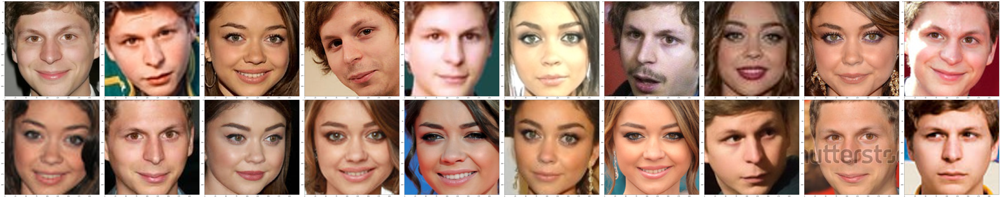

In [11]:
plot_image_sequence(train_X[train_y == 0], n=len(train_X[train_y == 0]), imgs_per_row=10)

Then Jesse's (class 1)

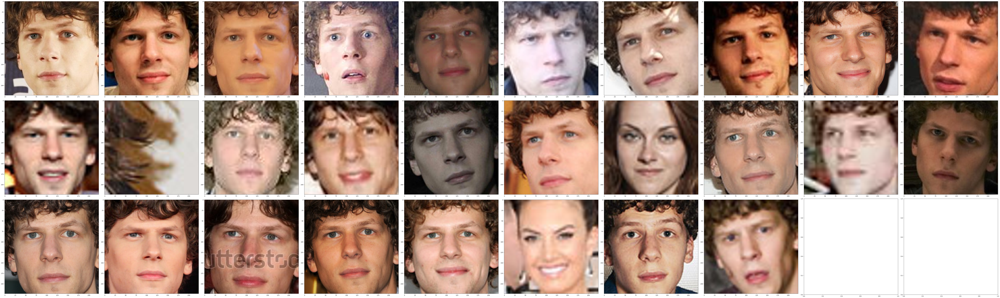

In [12]:
plot_image_sequence(train_X[train_y == 1], n=len(train_X[train_y == 1]), imgs_per_row=10)

And finally Mila's (class 2)

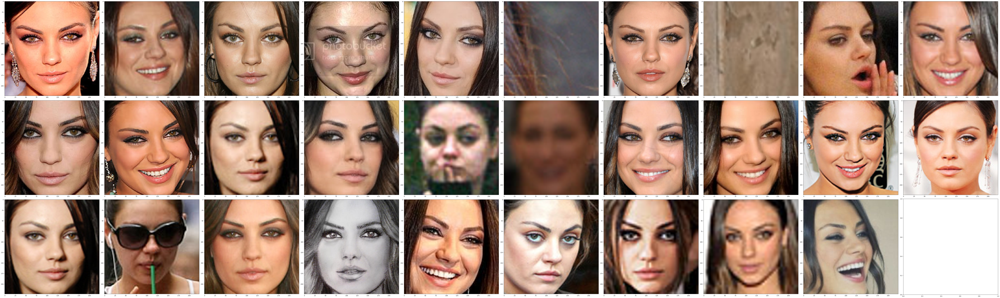

In [13]:
plot_image_sequence(train_X[train_y == 2], n=len(train_X[train_y == 2]), imgs_per_row=10)

# 1. Feature Representations

To kick off our face recognition pipeline, we first need to extract meaningful representations from the raw image data. Instead of feeding pixel values directly into a model, which can be both noisy and uninformative, we explored more expressive features that could better capture the identity-related patterns in facial images.

In this part, we experimented with two complementary approaches to feature construction: handcrafted features and learned features. Handcrafted features are built on well-established image descriptors that encode specific properties of local textures and edges. For this, we tried out the Histogram of Oriented Gradients (HOG) the Scale-Invariant Feature Transform (SIFT), and the t-distributed Stochastic Neighbor Embedding (t-SNE) both of which are commonly used in classical computer vision tasks.

Alongside that, we also looked into features that can be learned from the data itself. In particular, we applied Principal Component Analysis (PCA) to derive the so-called eigenfaces—a compact set of vectors that capture the most significant directions of variation across the dataset. This method allowed us to transform high-dimensional face images into a lower-dimensional space that still retained identity-discriminative information.

Each technique brings different strengths to the table. In the next sections, we go over the process of implementing and tuning these methods, visualizing the results, and comparing their usefulness in downstream face classification tasks.

## 1.0. Example: Identify feature extractor
Our example feature extractor doesn't actually do anything... It just returns the input:
$$
\forall x : f(x) = x.
$$

It does make for a good placeholder and baseclass ;).

In [14]:
class IdentityFeatureExtractor:
    """A simple function that returns the input"""

    def transform(self, X):
        return X

    def __call__(self, X):
        return self.transform(X)

## 1.1. Baseline 1: HOG feature extractor
1st step: Construct HOG feature extractor class by setting the best parameters after experimenting (e.g. orientations, pixels_per_cell)



In [15]:
from skimage.feature import hog

class HOGFeatureExtractor(IdentityFeatureExtractor):

    def __init__(self, orientations=9, pixels_per_cell=(6, 6), cells_per_block=(3, 3), block_norm='L2-Hys',
                 transform_sqrt=True,
                 feature_vector=True,
                 channel_axis=-1, visualize=False):

        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        self.block_norm = block_norm
        self.transform_sqrt = transform_sqrt
        self.feature_vector = feature_vector
        self.channel_axis = channel_axis

    def transform(self, X):
        features = []
        for image in X:
            features.append(self.extract_hog_features(image))
        return features

    def extract_hog_features(self, image):
        fd = hog(
            image,
            orientations=self.orientations,
            pixels_per_cell=self.pixels_per_cell,
            cells_per_block=self.cells_per_block,
            block_norm=self.block_norm,
            transform_sqrt=self.transform_sqrt,
            feature_vector=self.feature_vector,
            channel_axis=self.channel_axis,
        )
        return fd

2nd step: Initialize HOG feature extractor and extract features of train set and test set images



In [16]:
HOG = HOGFeatureExtractor()
feats = HOG.transform(train_X)
feats_test = HOG.transform(test_X)

### 1.1.1. t-SNE Plots

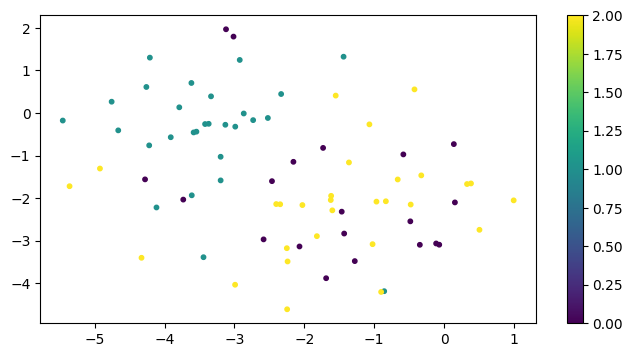

In [17]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2).fit_transform(np.array(feats))
plt.figure(figsize=(8, 4))
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=train_y, s=10)
plt.colorbar()
plt.show()

### 1.1.2. Discussion
After visualizing HOG features extracted from images of the train set, we observe that the features corresponding to subjects of class 1 (Jesse) and 2 (Mila) form two discrete clusters with only few exceptions of images falling into the wrong cluster. Subjects of class 0 fall into both clusters, which is expected, since some represent Michael who is a man and looks like Jesse, and others Sarah who is a woman and looks like Mila.

## 1.2. Baseline 2: PCA feature extractor

Now it's time to learn the feature directly from the data by performing a Principal Component Analysis (PCA). The procedure - of projecting the data onto the first few principal components (eigenfaces), to capture the key features needed for classification - will be presented step by step and in a visually-explicit way.

### 1.2.1 Preparing Data for PCA
Before inputting data into PCA, it is crucial to perform some further pre-processing, which helps the feature extraction. In fact, images are:

*   Downsized to 64 x 64 pixels, and then flattened (being transformed into a 4096-values array);
*   Transformed in greyscale;
*   Rescaled.

While the first two operations are realized to reduce the original dimensionality (in fact, the resulting array will have a dimensionality equal to the size of the image times the number of color channels, reduced to one with the greyscaling), the latter is a crucial basic operation to be realized every time performing PCA, so that it finds true directions of variance - PCA values directions of PCs relatively to origin, thus data must be centered. The resulting image dimension is deriving from relevant literature on eigenfaces (as facial identity cues - like spacing of eyes, face shape, eyebrows - are captured at relatively low resolutions).

In [18]:
# Define image shape for PCA
image_shape = (64, 64)

# Adjust preprocess to handle face output
def preprocess(img):
    # Scale and convert to uint8 if necessary
    if img.dtype != np.uint8:
        img = (img * 255).astype(np.uint8)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    resized = cv2.resize(gray, image_shape)
    return resized.flatten()

# Preprocess training images
X = np.array([preprocess(img) for img in train_X])

# Standardize the data before PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

### 1.2.2 Fitting PCA

PCA is conducted on the standardized dataset to reduce its dimensionality while preserving data variance.

Therefore, one key parameter to check is the cumulative variance to determine the number of components necessary to retain 95% of the data's variance.

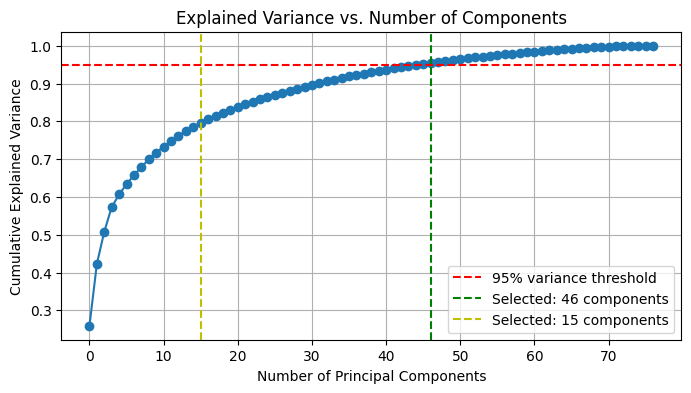

In [19]:
# Fit PCA
pca_full = PCA().fit(X_scaled)

plt.figure(figsize=(8, 4))
cum_var = np.cumsum(pca_full.explained_variance_ratio_)
plt.plot(cum_var, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% variance threshold')
plt.axvline(x=46, color='g', linestyle='--', label='Selected: 46 components')
plt.axvline(x=15, color='y', linestyle='--', label='Selected: 15 components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Components')
plt.legend()
plt.grid(True)
plt.show()

### 1.2.3 Plotting the different PCA components

We now visualize the first few principal components, commonly referred to as eigenfaces in facial recognition. These components capture the directions of highest variance in the dataset and often correspond to meaningful facial patterns. Below, we display the top 15 eigenfaces (ranked by explained variance), showing the most influential features learned from the data.

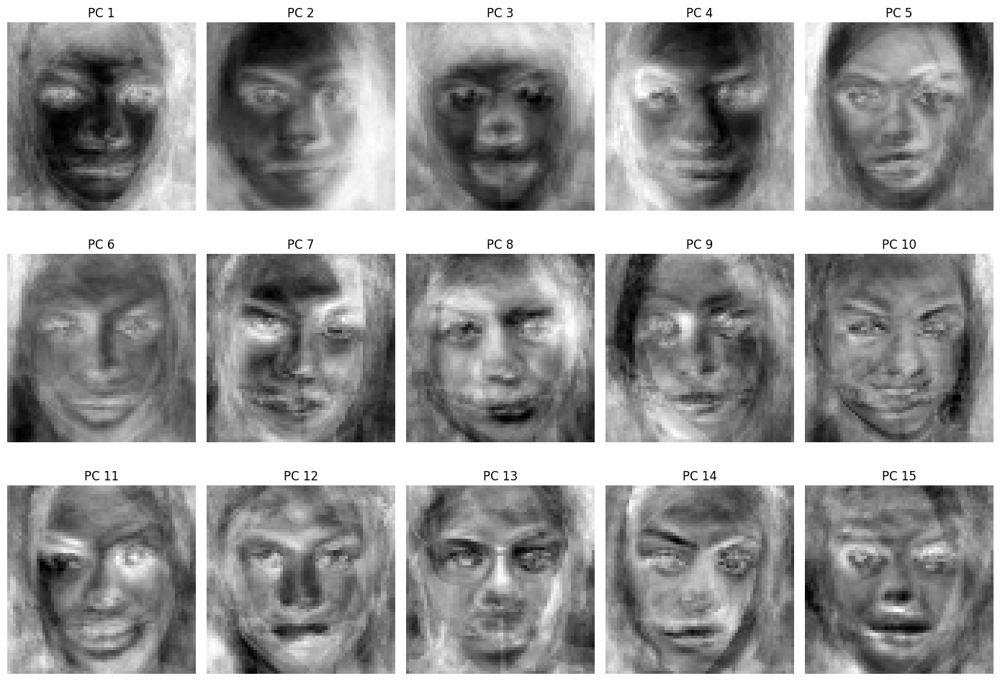

In [20]:
# Implement PCA with the desired number of components
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

# Visualize Eigenfaces
eigenfaces = pca.components_.reshape((-1, *image_shape))
fig, axes = plt.subplots(3, 5, figsize=(14, 10))
for i, ax in enumerate(axes.ravel()):
    ax.imshow(eigenfaces[i], cmap='gray')
    ax.set_title(f"PC {i+1}")
    ax.axis('off')
plt.tight_layout()

### 1.2.4 Reconstructing faces with PCs

Dimensionality reduction with PCA results in the loss of some features, and this can be observed when attempting to reconstruct faces with varying numbers of principal components. As the number of components decreases, the reconstruction becomes more blurry, reflecting the trade-off between compression and retained detail.

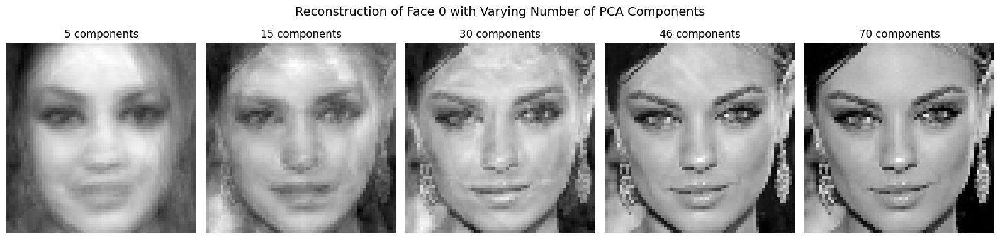

In [21]:
# Reconstruction test
idx = 0
components_list = [5, 15, 30, X_pca.shape[1], 70]
fig, axes = plt.subplots(1, 5, figsize=(16, 4))
for ax, p in zip(axes, components_list):
    pca_temp = PCA(n_components=p)
    X_reduced = pca_temp.fit_transform(X_scaled)
    X_reconstructed = pca_temp.inverse_transform(X_reduced)
    img = scaler.inverse_transform(X_reconstructed[idx].reshape(1, -1)).reshape(image_shape)
    ax.imshow(img, cmap='gray')
    ax.set_title(f"{p} components")
    ax.axis('off')

plt.suptitle(f"Reconstruction of Face {idx} with Varying Number of PCA Components", fontsize=14)
plt.tight_layout()
plt.show()

Printing non-zero eigenfaces

In [22]:
non_zero_eigenfaces = np.count_nonzero(pca.explained_variance_)
print(f"Number of non-zero eigenfaces: {non_zero_eigenfaces}")

Number of non-zero eigenfaces: 46


### 1.2.5 Visualizing representativeness of the first to PCs over the training set

The scatter plot below shows the projection of the face data onto the first two principal components (PC1 and PC2). Each point represents an image, color-coded by its class label. This visualization demonstrates that while the first two principal components capture some variance in the data, they are not sufficient to clearly distinguish between the classes in most cases.

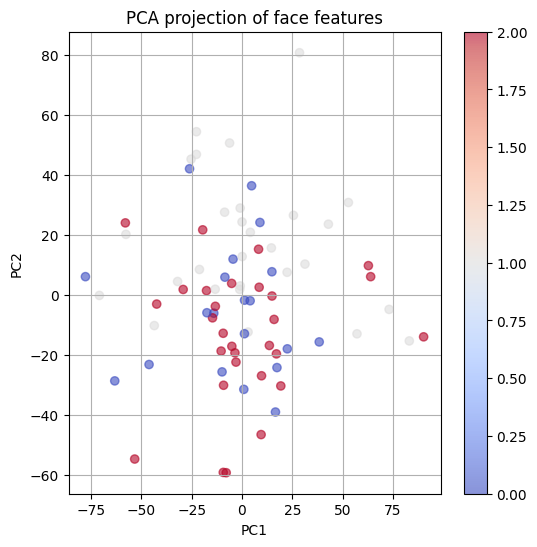

PCA Transformation Completed Successfully.


In [23]:
labels = train_y
plt.figure(figsize=(6,6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='coolwarm', alpha=0.6)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA projection of face features')
plt.colorbar()
plt.grid(True)
plt.show()

# Ensure test data preprocessing matches train
X_test_scaled = scaler.transform(np.array([preprocess(img) for img in test_X]))
X_test_pca = pca.transform(X_test_scaled)

print("PCA Transformation Completed Successfully.")

Below, a similar visualization is realized, but this time instead of making explicit the class, we output the original image in the scatter plot.

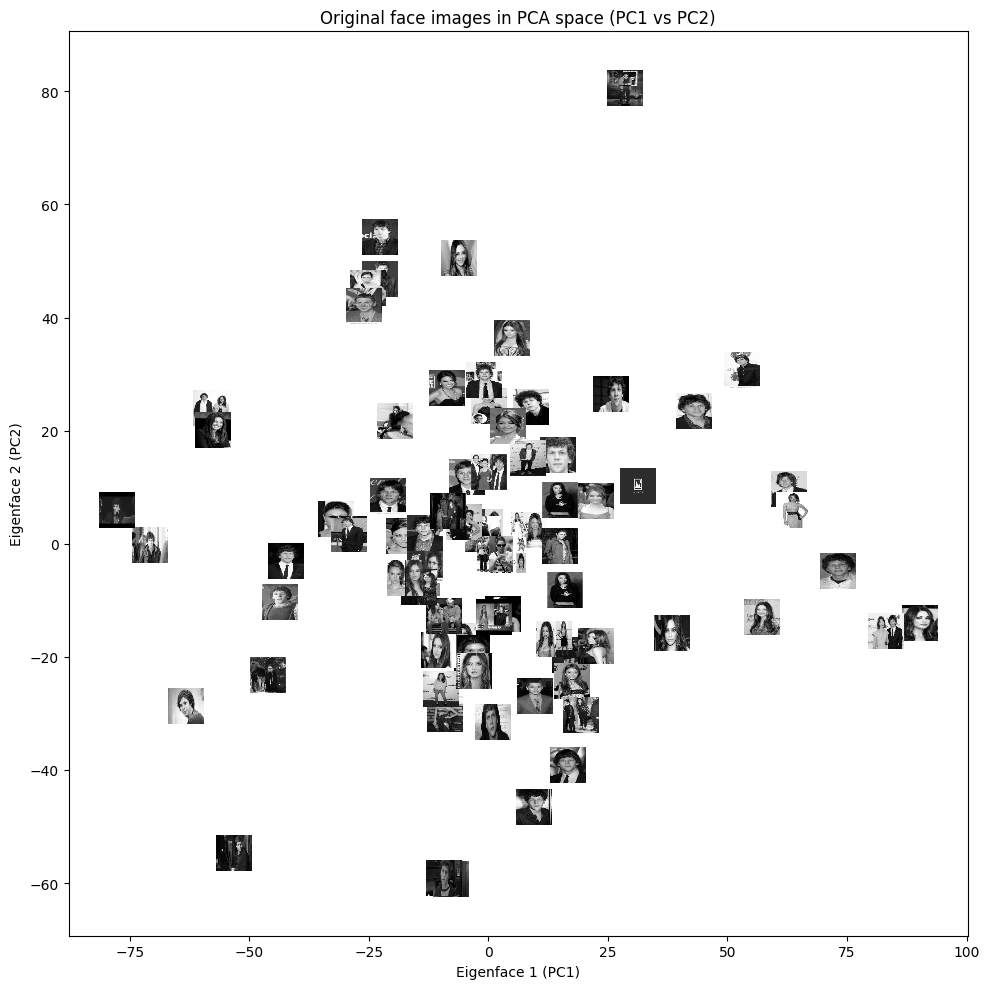

In [24]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox


original_images_gray = [preprocess(img).reshape(image_shape) for img in train['img']]

plt.figure(figsize=(10, 10))
ax = plt.gca()
ax.set_title("Original face images in PCA space (PC1 vs PC2)")
ax.set_xlabel("Eigenface 1 (PC1)")
ax.set_ylabel("Eigenface 2 (PC2)")


for i in range(len(X_pca)):
    image = OffsetImage(original_images_gray[i], zoom=0.4, cmap='gray')
    ab = AnnotationBbox(image, (X_pca[i, 0], X_pca[i, 1]), frameon=False)
    ax.add_artist(ab)

ax.set_xlim(X_pca[:, 0].min() - 10, X_pca[:, 0].max() + 10)
ax.set_ylim(X_pca[:, 1].min() - 10, X_pca[:, 1].max() + 10)
plt.grid(False)
plt.tight_layout()
plt.show()

### Why We Use SVD (Not EVD) for PCA on Image Data

For image data, Singular Value Decomposition (SVD) is the preferred method over Eigenvalue Decomposition (EVD) for several reasons. EVD requires computing the full covariance matrix, which is computationally expensive and unstable for high-dimensional data like images. With 4096 features and only 80 samples, the covariance matrix becomes large (4096×4096) and likely rank-deficient. On the other hand, SVD directly decomposes the data matrix, making it more numerically stable and efficient. This is why sklearn.PCA uses SVD internally. While EVD may work in small cases, SVD is robust and scalable, making it the clear choice for image-based PCA.

### 1.2.6 PCA Extractor for later usage

In this section, we define a custom PCAFeatureExtractor class that encapsulates the entire process of PCA-based dimensionality reduction. The class is initialized with the desired number of components (in this case, set to retain 95% of the original variance). The fit method scales the input data and fits the PCA model, while the transform method applies the learned PCA transformation to the data. Additionally, the inverse_transform method allows for reconstructing the original data from the PCA-transformed representation. This feature extractor ensures that the transformation can be reused later for both training and test datasets, maintaining consistency in data processing.

Then, the training and test data are flattened from their 2D image representations into 1D vectors. Then, the previously defined PCAFeatureExtractor is used to fit the training data and transform both the training and test sets into their PCA representations.

In [25]:
class PCAFeatureExtractor:
    """Feature extractor using PCA for dimensionality reduction."""

    def __init__(self, n_components):
        self.n_components = n_components
        self.scaler = StandardScaler()
        self.pca = PCA(n_components=n_components)
        self.is_fitted = False

    def fit(self, X):
        X_scaled = self.scaler.fit_transform(X)
        self.pca.fit(X_scaled)
        self.is_fitted = True
        return self

    def transform(self, X):
        if not self.is_fitted:
            raise ValueError("PCAFeatureExtractor is not fitted yet. Call fit() first.")
        X_scaled = self.scaler.transform(X)
        return self.pca.transform(X_scaled)

    def inverse_transform(self, X_pca):
        if not self.is_fitted:
            raise ValueError("PCAFeatureExtractor is not fitted yet. Call fit() first.")
        X_scaled_reconstructed = self.pca.inverse_transform(X_pca)
        return self.scaler.inverse_transform(X_scaled_reconstructed)

# Preprocess images to prepare for PCA
X = np.array([preprocess(img) for img in train_X])
X_test_images = np.array([preprocess(img) for img in test_X if img is not None])

# Initialize and use the PCAFeatureExtractor
pca_extractor = PCAFeatureExtractor(n_components=0.95)
pca_extractor.fit(X)
X_pca = pca_extractor.transform(X)
X_test_pca = pca_extractor.transform(X_test_images)

print("Training PCA shape:", X_pca.shape)
print("Test PCA shape:", X_test_pca.shape)
print("Train labels:", train_y.shape)

Training PCA shape: (77, 46)
Test PCA shape: (1816, 46)
Train labels: (77,)


# 2. Evaluation Metrics

Now it's finally time to evaluate the classifiers using PCA

In [26]:
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

The classifiers are then evaluted through:


*   Accuracy: the most common evaluation metric, representing the proportion of correct predictions to the total number of predictions. However, relying on accuracy alone can be misleading, especially in the presence of class imbalances;

*   Precision-Recall Table: provides a more nuanced understanding of how the model handles each class in terms of false positives and false negatives, as precision refers to the proportion of positive predictions that are actually correct, while recall indicates the proportion of actual positives that were correctly identified by the model. This is particularly useful in cases where one class is more important to correctly identify than the other. For example, in medical diagnostics, false negatives (failing to detect a disease) may be more costly than false positives.

*   F1-Score: it is the harmonic mean of precision and recall, providing a single value that balances the two, penalizing extreme imbalances between them.

*   Confusion Matrix: The confusion matrix gives a detailed view of the model’s classification mistakes. In multi-class problems, it displays how the model misclassifies instances of each class. By showing where errors occur, it allows for a more targeted analysis of the model’s weaknesses. For example, a classifier might consistently confuse two similar classes, and the confusion matrix will make this evident, guiding further model refinement.

In [27]:
def evaluate_classifier(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred))

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
    plt.title(f'Confusion Matrix: {model.__class__.__name__}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# 3. Classifiers
## 3.0. Example: The *'not so smart'* classifier
This random classifier is not very complicated. It makes predictions at random, based on the distribution obseved in the training set. **It thus assumes** that the class labels of the test set will be distributed similarly to the training set.

In [28]:
class RandomClassificationModel:
    """Random classifier, draws a random sample based on class distribution observed
    during training."""

    def fit(self, X, y):
        """Adjusts the class ratio instance variable to the one observed in y.

        Parameters
        ----------
        X : tensor
            Training set
        y : array
            Training set labels

        Returns
        -------
        self : RandomClassificationModel
        """

        self.classes, self.class_ratio = np.unique(y, return_counts=True)
        self.class_ratio = self.class_ratio / self.class_ratio.sum()
        return self

    def predict(self, X):
        """Samples labels for the input data.

        Parameters
        ----------
        X : tensor
            dataset

        Returns
        -------
        y_star : array
            'Predicted' labels
        """

        np.random.seed(0)
        return np.random.choice(self.classes, size = X.shape[0], p=self.class_ratio)

    def __call__(self, X):
        return self.predict(X)


## 3.1. My favorite classifiers

*   Support Vector Machine (SVM): Effective for high-dimensional spaces, and widely used in classification tasks.
*   AdaBoost: An ensemble method that combines multiple weak learners to form a strong classifier.
*   XGBoost classifier: classification component of XGBoost, a powerful and widely used machine learning algorithm, commonly used for supervised learning tasks
*   Stochastic Gradient Descent (SGD): A linear model trained with a stochastic optimization method, efficient for large datasets.
*   Decision Tree: Non-parametric and interpretable, capturing complex decision boundaries.
*   Gaussian Naive Bayes: Based on Bayes' theorem, suitable for data where features are assumed to be conditionally independent.
*   Logistic Regression: A simple yet effective linear model for binary classification.
*   Random Forest: An ensemble of decision trees, offering high accuracy and control over-fitting.
*   K-Nearest Neighbors (KNN): A simple, instance-based learner effective for small training sets.

In [29]:
# SVM
svm = SVC(kernel='rbf', C=1, gamma='scale')
# AdaBoost
ada = AdaBoostClassifier(n_estimators=100)
# SGD
sgd = SGDClassifier(loss='log_loss', max_iter=1000, tol=1e-3)
# Decision Tree
tree = DecisionTreeClassifier(max_depth=5)
# Gaussian Naive Bayes
gnb = GaussianNB()
# XGBoost
bst = XGBClassifier(n_estimators=2, max_depth=2, learning_rate=1, objective='multi:softmax', num_class = 3)
# Logistic Regression
logreg = LogisticRegression(max_iter=1000)
# Random Forest
rf = RandomForestClassifier(n_estimators=100)
# KNN
knn = KNeighborsClassifier(n_neighbors=3)


classifiers = {
    'SVM': svm,
    'AdaBoost': ada,
    'XGBoost': bst,
    'SGD': sgd,
    'Decision Tree': tree,
    'Gaussian NB': gnb,
    'Logistic Regression': logreg,
    'Random Forest': rf,
    'KNN': knn
}

Split initial training set into train/validation set to accurately evaluate classifiers. \
We keep 80% of instances for the train set.

In [30]:
# PCA features
X_train_pca, X_val_pca, y_train_pca, y_val_pca = train_test_split(X_pca, train_y, test_size=0.2)

# HOG features
X_train_hog, X_val_hog, y_train_hog, y_val_hog = train_test_split(feats, train_y, test_size=0.2)

Classify images using PCA features


Evaluating: SVM using PCA features
Accuracy: 0.5000
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.78      1.00      0.88         7
           2       0.14      0.50      0.22         2

    accuracy                           0.50        16
   macro avg       0.31      0.50      0.37        16
weighted avg       0.36      0.50      0.41        16



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


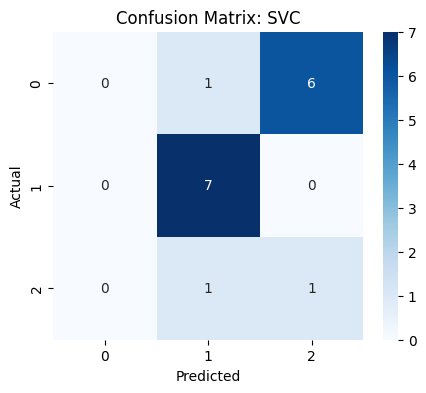


Evaluating: AdaBoost using PCA features
Accuracy: 0.5000
              precision    recall  f1-score   support

           0       0.50      0.14      0.22         7
           1       1.00      0.71      0.83         7
           2       0.22      1.00      0.36         2

    accuracy                           0.50        16
   macro avg       0.57      0.62      0.47        16
weighted avg       0.68      0.50      0.51        16



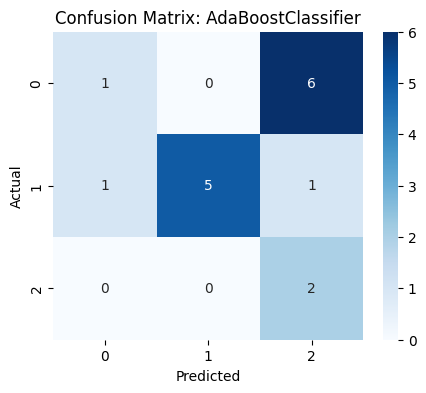


Evaluating: XGBoost using PCA features
Accuracy: 0.5625
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.78      1.00      0.88         7
           2       0.29      1.00      0.44         2

    accuracy                           0.56        16
   macro avg       0.35      0.67      0.44        16
weighted avg       0.38      0.56      0.44        16



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


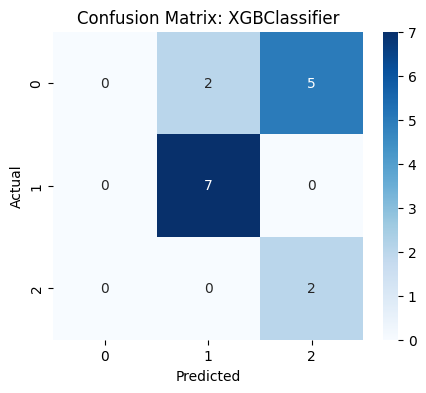


Evaluating: SGD using PCA features
Accuracy: 0.8125
              precision    recall  f1-score   support

           0       1.00      0.57      0.73         7
           1       1.00      1.00      1.00         7
           2       0.40      1.00      0.57         2

    accuracy                           0.81        16
   macro avg       0.80      0.86      0.77        16
weighted avg       0.93      0.81      0.83        16



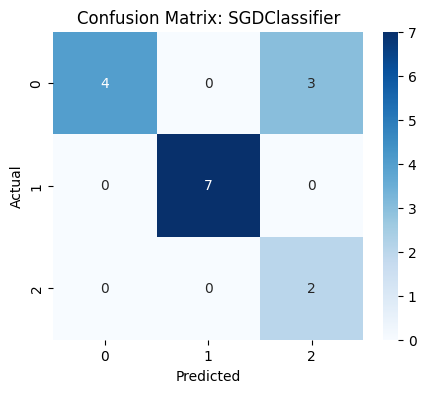


Evaluating: Decision Tree using PCA features
Accuracy: 0.5000
              precision    recall  f1-score   support

           0       0.33      0.14      0.20         7
           1       0.83      0.71      0.77         7
           2       0.29      1.00      0.44         2

    accuracy                           0.50        16
   macro avg       0.48      0.62      0.47        16
weighted avg       0.55      0.50      0.48        16



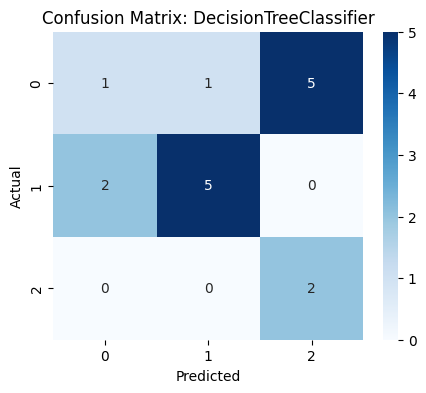


Evaluating: Gaussian NB using PCA features
Accuracy: 0.5625
              precision    recall  f1-score   support

           0       1.00      0.29      0.44         7
           1       0.83      0.71      0.77         7
           2       0.25      1.00      0.40         2

    accuracy                           0.56        16
   macro avg       0.69      0.67      0.54        16
weighted avg       0.83      0.56      0.58        16



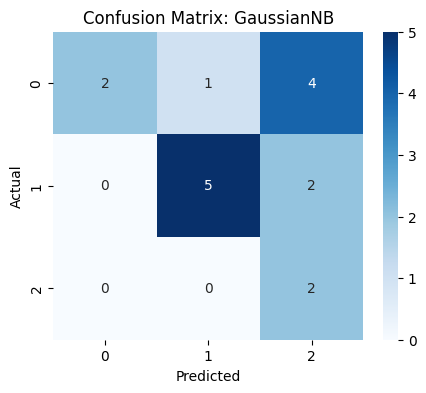


Evaluating: Logistic Regression using PCA features
Accuracy: 0.8125
              precision    recall  f1-score   support

           0       1.00      0.57      0.73         7
           1       0.78      1.00      0.88         7
           2       0.67      1.00      0.80         2

    accuracy                           0.81        16
   macro avg       0.81      0.86      0.80        16
weighted avg       0.86      0.81      0.80        16



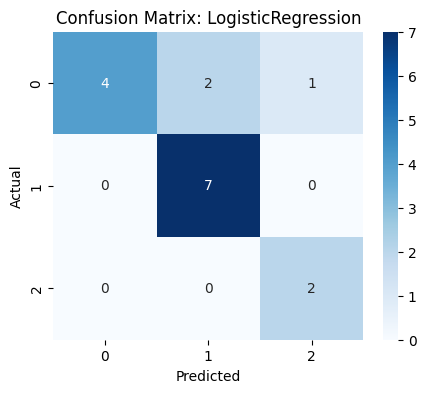


Evaluating: Random Forest using PCA features
Accuracy: 0.4375
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         7
           1       0.71      0.71      0.71         7
           2       0.22      1.00      0.36         2

    accuracy                           0.44        16
   macro avg       0.31      0.57      0.36        16
weighted avg       0.34      0.44      0.36        16



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


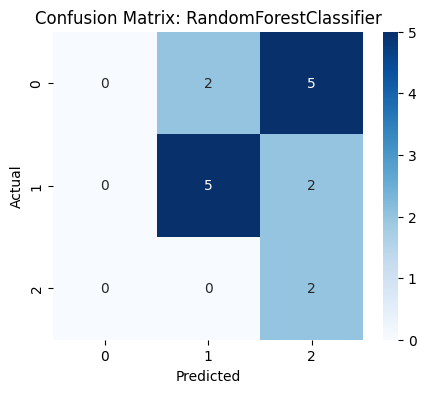


Evaluating: KNN using PCA features
Accuracy: 0.5625
              precision    recall  f1-score   support

           0       0.67      0.29      0.40         7
           1       0.70      1.00      0.82         7
           2       0.00      0.00      0.00         2

    accuracy                           0.56        16
   macro avg       0.46      0.43      0.41        16
weighted avg       0.60      0.56      0.54        16



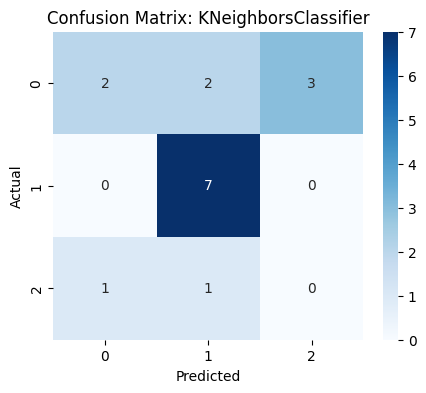

In [31]:
for name, clf in classifiers.items():
    print(f"\nEvaluating: {name} using PCA features")

    # Use train/validation split
    evaluate_classifier(clf, X_train_pca, y_train_pca, X_val_pca, y_val_pca)

Classify images using HOG features


Evaluating: SVM using HOG features
Accuracy: 0.5000
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.50      0.83      0.62         6
           2       0.50      0.43      0.46         7

    accuracy                           0.50        16
   macro avg       0.33      0.42      0.36        16
weighted avg       0.41      0.50      0.44        16



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


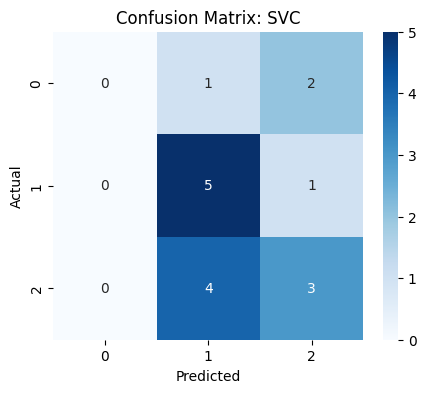


Evaluating: AdaBoost using HOG features
Accuracy: 0.6250
              precision    recall  f1-score   support

           0       0.43      1.00      0.60         3
           1       0.67      0.67      0.67         6
           2       1.00      0.43      0.60         7

    accuracy                           0.62        16
   macro avg       0.70      0.70      0.62        16
weighted avg       0.77      0.62      0.62        16



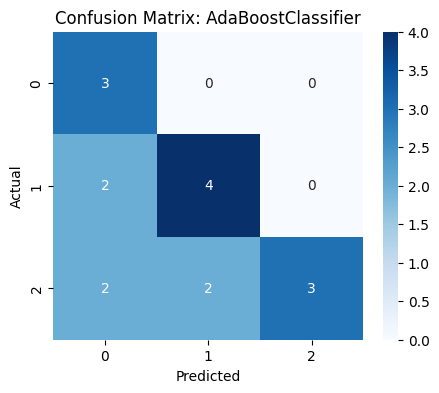


Evaluating: XGBoost using HOG features
Accuracy: 0.6250
              precision    recall  f1-score   support

           0       0.40      0.67      0.50         3
           1       0.67      0.67      0.67         6
           2       0.80      0.57      0.67         7

    accuracy                           0.62        16
   macro avg       0.62      0.63      0.61        16
weighted avg       0.68      0.62      0.64        16



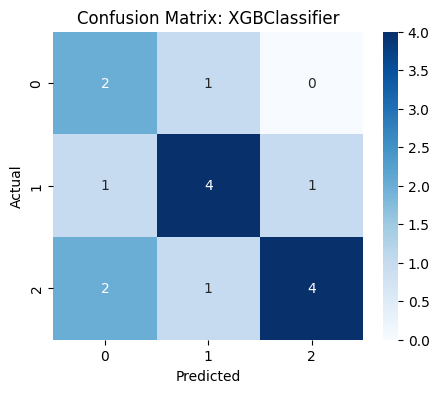


Evaluating: SGD using HOG features
Accuracy: 0.6250
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.55      1.00      0.71         6
           2       0.75      0.43      0.55         7

    accuracy                           0.62        16
   macro avg       0.77      0.59      0.58        16
weighted avg       0.72      0.62      0.60        16



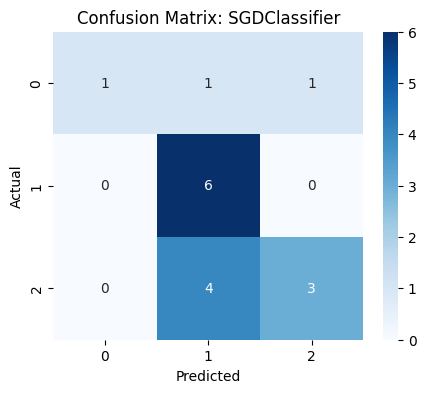


Evaluating: Decision Tree using HOG features
Accuracy: 0.3750
              precision    recall  f1-score   support

           0       0.29      0.67      0.40         3
           1       0.43      0.50      0.46         6
           2       0.50      0.14      0.22         7

    accuracy                           0.38        16
   macro avg       0.40      0.44      0.36        16
weighted avg       0.43      0.38      0.35        16



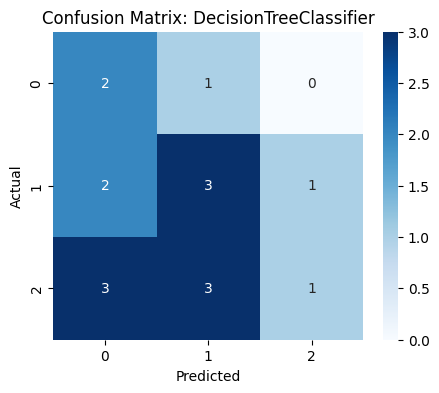


Evaluating: Gaussian NB using HOG features
Accuracy: 0.6250
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.60      1.00      0.75         6
           2       0.67      0.57      0.62         7

    accuracy                           0.62        16
   macro avg       0.42      0.52      0.46        16
weighted avg       0.52      0.62      0.55        16



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


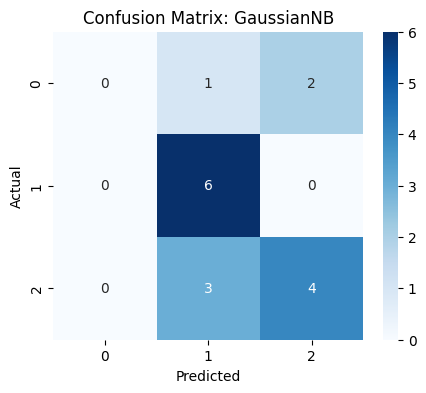


Evaluating: Logistic Regression using HOG features
Accuracy: 0.5625
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.50      0.83      0.62         6
           2       0.60      0.43      0.50         7

    accuracy                           0.56        16
   macro avg       0.70      0.53      0.54        16
weighted avg       0.64      0.56      0.55        16



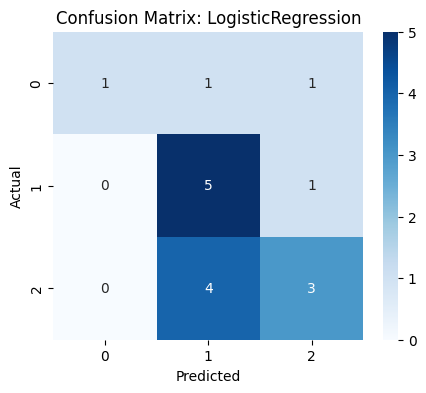


Evaluating: Random Forest using HOG features
Accuracy: 0.5625
              precision    recall  f1-score   support

           0       0.50      0.33      0.40         3
           1       0.56      0.83      0.67         6
           2       0.60      0.43      0.50         7

    accuracy                           0.56        16
   macro avg       0.55      0.53      0.52        16
weighted avg       0.56      0.56      0.54        16



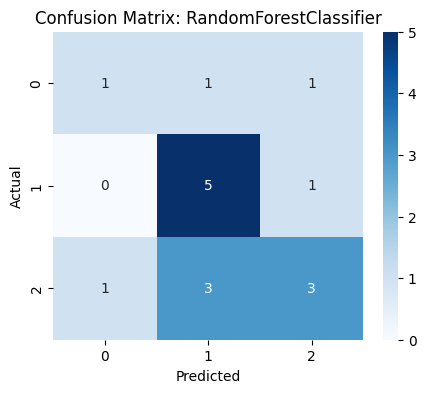


Evaluating: KNN using HOG features
Accuracy: 0.6250
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.62      0.83      0.71         6
           2       0.62      0.71      0.67         7

    accuracy                           0.62        16
   macro avg       0.42      0.52      0.46        16
weighted avg       0.51      0.62      0.56        16



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


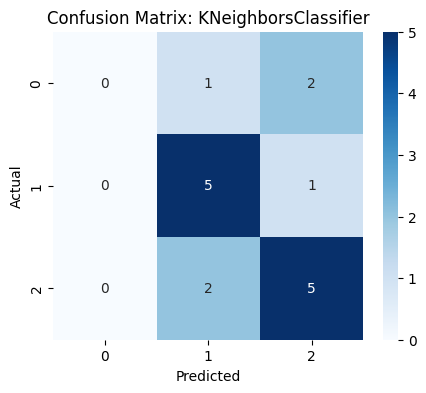

In [32]:
for name, clf in classifiers.items():
    print(f"\nEvaluating: {name} using HOG features")

    # Use train/validation split
    evaluate_classifier(clf, X_train_hog, y_train_hog, X_val_hog, y_val_hog)

# 4. Experiments
<div class="alert alert-block alert-info"> <b>NOTE:</b> Do <i>NOT</i> use this section to keep track of every little change you make in your code! Instead, highlight the most important findings and the major (best) pipelines that you've discovered.  
</div>
<br>

## 4.0. Example: basic pipeline
The basic pipeline takes any input and samples a label based on the class label distribution of the training set. As expected the performance is very poor, predicting approximately 1/4 correctly on the training set. There is a lot of room for improvement but this is left to you ;).

In [33]:
feature_extractor = IdentityFeatureExtractor()
classifier = RandomClassificationModel()

# train the model on the features
classifier.fit(feature_extractor(train_X), train_y)

# model/final pipeline
model = lambda X: classifier(feature_extractor(X))

In [34]:
# evaluate performance of the model on the training set
train_y_star = model(train_X)

"The performance on the training set is {:.2f}. This however, does not tell us much about the actual performance (generalisability).".format(
    accuracy_score(train_y, train_y_star))

'The performance on the training set is 0.32. This however, does not tell us much about the actual performance (generalisability).'

In [35]:
# predict the labels for the test set
test_y_star = model(test_X)

<h1> 4.1 Classifier Improvement </h1>

In this section, we tried to leverage the state-of-the-art models to improve the performance of our classifier.

First iteration: Initially we tried to improve face extraction by tuning the HAAR classifier, using the hog features and by augmenting the train data, achieved some minimal improvements.

Second iteration: We used, pretrained on imagenet, MobileNet and ResNet backbones and further increased our accuracy. We decided to quickly change strategy since we wanted the produced features to focus more on faces specifically.

Third iteration: We used the pretrained image encoder of OpenAI's CLIP model to extract features from the images. CLIP has been trained on a large dataset of images and text, allowing it to learn rich representations of visual data. 
Then, we trained classifiers such as linear SVM, logistic regression, and random forest on the extracted embeddings.
This yielded to a significant improvement in accuracy, reaching 0.91189 on the test set.

Final iteration: We decided to use a pretrained inception backbone with weights derived from the VGGFace2 dataset. Initially we did not want to use the specific dataset to avoid image bias, but then we found out that VGGFace is not a subset of VGGFace2. This approach yielded very good results, reaching accuracy of 0.98237 on the test set. Even when using the same backbone pretrained on the CasiaWebFace dataset, the performance drops only to 0.97852.
Below, the steps followed to achieve this result are described in detail.

In [36]:
# Input data files are available in the read-only "../input/" directory

train = pd.read_csv(
    '/kaggle/input/kul-computer-vision-ga-1-2025/train_set.csv', index_col = 0)
train.index = train.index.rename('id')

test = pd.read_csv(
    '/kaggle/input/kul-computer-vision-ga-1-2025/test_set.csv', index_col = 0)
test.index = test.index.rename('id')

# read the images as numpy arrays and store in "img" column
train['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-computer-vision-ga-1-2025/train/train_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in train.iterrows()]

test['img'] = [cv2.cvtColor(np.load('/kaggle/input/kul-computer-vision-ga-1-2025/test/test_{}.npy'.format(index), allow_pickle=False), cv2.COLOR_BGR2RGB) 
                for index, row in test.iterrows()]
  

train_size, test_size = len(train),len(test)

"The training set contains {} examples, the test set contains {} examples.".format(train_size, test_size)

'The training set contains 80 examples, the test set contains 1816 examples.'

<h1> Problem Formulation </h1>

There are three main issues you have to deal with to improve the performance of the classifier:

1. Data Loading: The HAAR cascade classifier does not acurately detecnt the faces in the images. This leads to the calculation of features/embeddings on a subset of wrong images, containing no faces, multiple faces, or faces that are not within the class of interest.
2. Feature Extraction: The features extracted from the images by the models are influenced a lot by the quality of the images. Especially when the images are not well aligned, the features extracted are not very useful. This is especially apparent when using bare bone models.
3. Classification: The selection of a classifier is directly related to the quality of the features extracted. Each classifier has its own biases and assumptions. The choice of classifier is also related to the number of samples you have. For example, if you have a lot of samples, you can use a more complex classifier like a neural network. If you have a small number of samples, you should use a simpler classifier like SVM or KNN.

Data Loading: Outlier Example

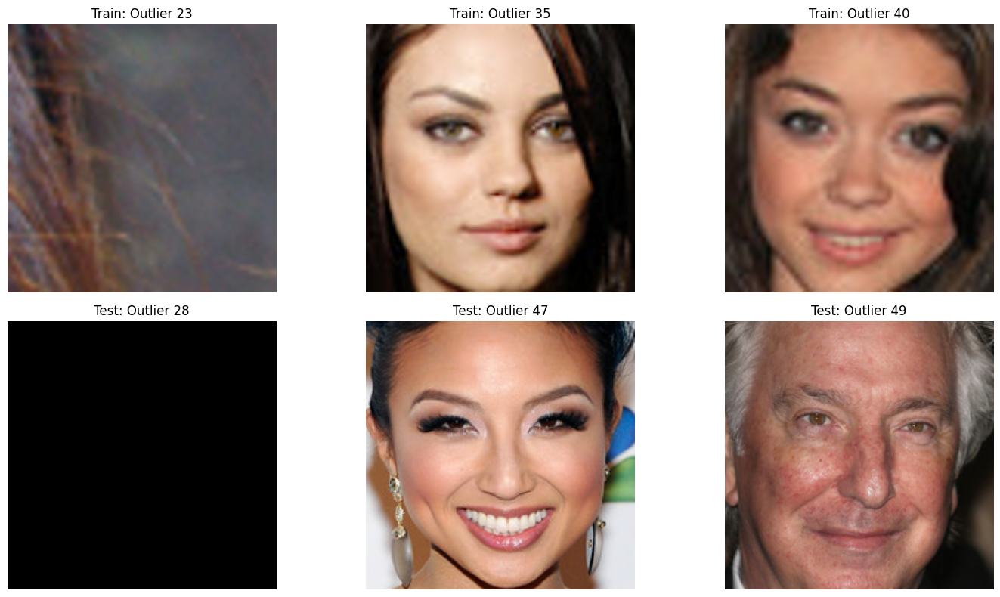

In [37]:
outliers_train= [23, 35, 40]
outliers_test = [28,47,49]

fig, axes = plt.subplots(2, max(len(outliers_train), len(outliers_test)), figsize=(15, 8))

for idx, i in enumerate(outliers_train):
    img = train_X[i]
    if img is not None and img.shape[-1] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[0, idx].imshow(img.astype(np.uint8))
    axes[0, idx].axis('off')
    axes[0, idx].set_title(f"Train: Outlier {i}")

# --- Plot test outliers ---
for idx, i in enumerate(outliers_test):
    img = test_X[i]
    if img is not None and img.shape[-1] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[1, idx].imshow(img.astype(np.uint8))
    axes[1, idx].axis('off')
    axes[1, idx].set_title(f"Test: Outlier {i}")

# Turn off any remaining axes
for ax in axes.flatten()[len(outliers_train) + len(outliers_test):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

As shown in the above cell, we found that within the train and test sets, there are many outliers (faces of persons not in the classes we are trying to classify or not correctly extracted faces). We also found that both in the test and train, there are images of various resolutions, aspect ratios and lighting conditions. 
To counter the data discrepancies, we chose to do the following:
1. Defince the classification classes into 4 classes:
    - 0: Michael Cera
    - 1: Jesse Eisenberg
    - 2: Mila Kunis
    - 3: Sarah Silverman
2. Use a pretrained inception backbone, to extract embedings for each class.
3. For each class, we chose a specific example witch contained a very high quality, well aligned face. For each class, we computed the embedding for the specific example and used that as the class center. Since we are using a pretrained model, we do not need many samples to form the class center. For that matter, we did not have to fine tune the model on the train set, ensuring that the model would not overfit, learn the noise and outliers in the train set, ensuring computational efficiency and keeping a few shot mentality.
4. We replaced the HAAR cascade classifier with a MTCNN face detector, a deep learning based face detector. For each face detected, we computed the embedding and compared it to the class centers (using cosine similarity). The class center with the smallest distance to the embedding was chosen as the predicted class. In that way, we only kept the faces of interest, while also classified the faces at the same time. We set up a hyperparameter: threshold, which is the distance between the embedding and the class center. If the distance is greater than the threshold, we classify the face as "other". This way,we can filter out the outliers and faces that are not in the classes of interest.

<h1> Data Preparation </h1>

Defining the renewed classes

In [38]:
train.loc[train['name'] == 'Sarah_Hyland', 'class'] = 3

Class centers: We chose examples of high quality.

In [39]:
reference_images = {
    0: [train.img[44]],
    1: [train.img[19]],
    2: [train.img[26]],
    3: [train.img[11]]
}

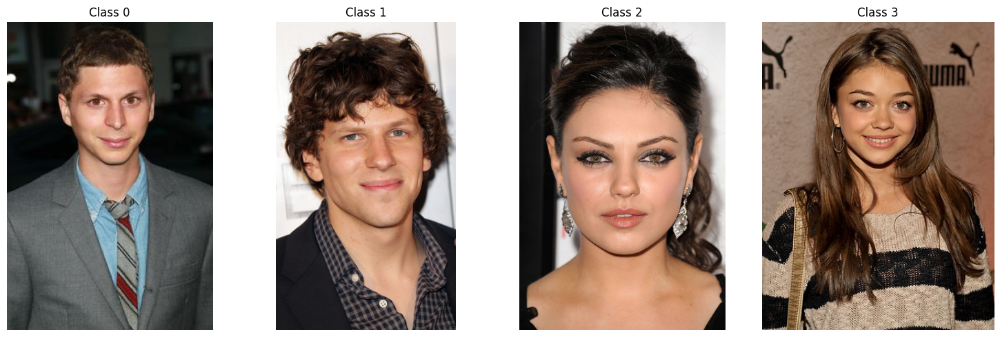

In [40]:
fig, axes = plt.subplots(1, len(reference_images), figsize=(15, 5))

for idx, (label, images) in enumerate(reference_images.items()):
    axes[idx].imshow(images[0])
    axes[idx].axis('off')
    axes[idx].set_title(f"Class {label}")

plt.tight_layout()
plt.show()

Extraction of faces within the selected examples 

In [41]:
from mtcnn import MTCNN

def detect_faces(image):
    detector = MTCNN()
    faces = detector.detect_faces(image)
    if len(faces) > 0:
        return faces[0]['box']
    else:
        return None
    
reference_extracted = []
for name, images in reference_images.items():
    for image in images:
        box = detect_faces(image)
        if box is not None:
            x, y, w, h = box
            face = image[y:y+h, x:x+w]
            reference_extracted.append((name, face))

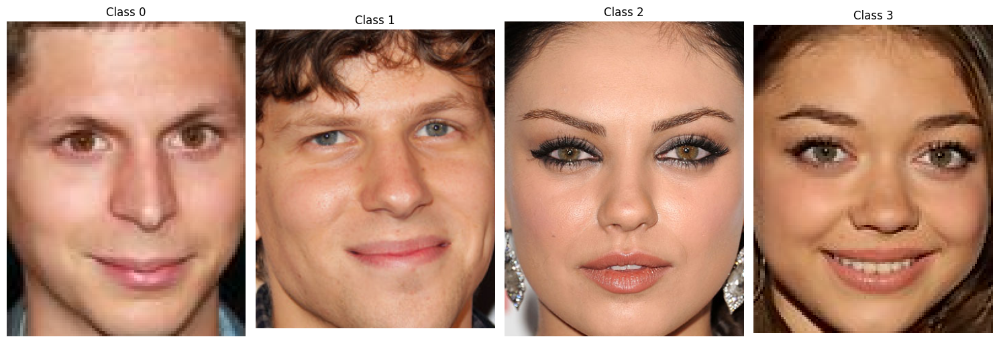

In [42]:
fig, axes = plt.subplots(1, len(reference_extracted), figsize=(15, 5))

for idx, (label, image) in enumerate(reference_extracted):
    axes[idx].imshow(image)
    axes[idx].axis('off')
    axes[idx].set_title(f"Class {label}")

plt.tight_layout()
plt.show()

<h1> Model Selection </h1>

We chose the pretrained InceptionResnetV1 model as the backbone for the face embedding extraction.
There are two kinds of pretrained weights:
1. VGGFace2 dataset
2. CASIA-WebFace dataset

We evaluated the performance on both models and found out that VGGFace2 slightly outperformed the CASIA-WebFace model. 

It is worth to note that VGGFace is not a subset of VGGFace2, but a different dataset. In that regard, the pretrained model has not been trained on the same dataset as the one we are using.


In [43]:
!pip install pillow==9.5.0 --upgrade
!pip install facenet-pytorch --upgrade
import PIL._util
if not hasattr(PIL._util, 'is_directory'):
    import os
    PIL._util.is_directory = os.path.isdir

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 12.0 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: pillow 10.2.0
    Uninstalling pillow-10.2.0:
      Successfully uninstalled pillow-10.2.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
facenet-pytorch 2.6.0 requires Pillow<10.3.0,>=10.2.0, but you have pillow 9.5.0 which is incompatible.
google-genai 0.2.2 requires pillow<12.0.0,>=10.0.0, but you have pillow 9.5.0 which is incompatible.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.
plotnine 0.14.4 requires matplotlib>=3.8.0, but you have matplotlib 3.7.5 which is incompatible.
scikit-image 0.25.0 requires pillow>=10.1, but you have pillow 9.5.0 which is incompatible.
  Using cached pillow-10.2.0-cp310-cp310-manylinux_2_28_x86_64.whl.metadata (9.7 kB)
Using cached p

In [44]:
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from facenet_pytorch import InceptionResnetV1
import torch
from PIL import Image

device = torch.device('mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

resnet = InceptionResnetV1(pretrained='vggface2').eval().to(device)
preprocess = Compose([
    Resize((160, 160)),
    ToTensor(),
    Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

def get_embedding(face_array):
    """Compute a 512-d embedding for a given face (as a NumPy array)."""
    # Convert the array to uint8 and ensure it is RGB
    image = Image.fromarray(face_array.astype(np.uint8)).convert('RGB')
    image_tensor = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        embedding = resnet(image_tensor)
    return embedding.cpu().numpy().flatten()

reference_embeddings = { 
                        name: get_embedding(face) 
    for name, face in reference_extracted
}

Using device: cuda


  0%|          | 0.00/107M [00:00<?, ?B/s]

Visualization of class centers

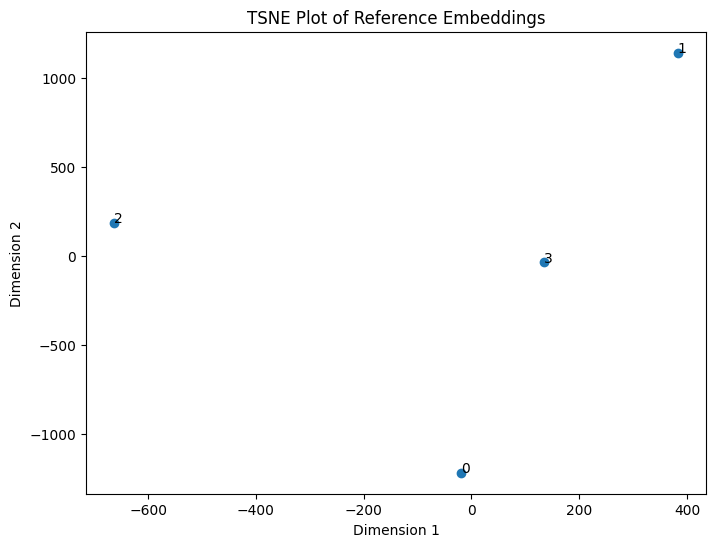

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Get names and stack the embeddings from your already-defined dictionary "reference_embeddings"
names = list(reference_embeddings.keys())
embeddings = np.stack(list(reference_embeddings.values()))

# Set perplexity to a value less than the number of samples (here, 2 since we have 4 samples)
tsne = TSNE(n_components=2, random_state=42, perplexity=2)
embeddings_2d = tsne.fit_transform(embeddings)

# Create the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1])

# Annotate each point with the corresponding name
for i, name in enumerate(names):
    plt.annotate(name, (embeddings_2d[i, 0], embeddings_2d[i, 1]))

plt.title("TSNE Plot of Reference Embeddings")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.show()

<h1> Classifier </h1>
The FaceMatcher class is responsible for everything discussed up to this point. It extracts the faces within the pictures using the MTCNN face detector, computes the embeddings using the InceptionResnetV1 model and classifies the faces using the cosine similarity between the embeddings and the class centers.
It works in batches to speed up the process through GPU parallelization. 

In [46]:
import numpy as np
import torch
import torch.nn.functional as F
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from facenet_pytorch import InceptionResnetV1
from mtcnn import MTCNN
from PIL import Image
from tqdm import tqdm 

class FaceMatcher:
    def __init__(self, reference_extracted, device=None, pretrained='vggface2'):
        """
        Initialize the FaceMatcher.

        Args:
            reference_extracted (iterable): Iterable of (name, face_array) pairs.
            device (torch.device, optional): Device to run on. If None, it selects automatically.
            pretrained (str): The pre-trained model type to load.
        """
        # Automatically select device if not provided.
        if device is None:
            device = torch.device(
                'mps' if torch.backends.mps.is_available() else 
                'cuda' if torch.cuda.is_available() else 'cpu'
            )
        self.device = device
        print(f"Using device: {self.device}")

        # Load the pre-trained model and define preprocessing.
        self.resnet = InceptionResnetV1(pretrained=pretrained).eval().to(self.device)
        self.preprocess = Compose([
            Resize((160, 160)),
            ToTensor(),
            Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])

        # Initialize the MTCNN face detector.
        self.detector = MTCNN()

        # Precompute reference embeddings as torch tensors and store labels.
        self.reference_embeddings = {
            name: self.get_embedding(face).squeeze(0) for name, face in reference_extracted
        }
        self.ref_labels = list(self.reference_embeddings.keys())
        self.ref_embeddings = torch.stack([self.reference_embeddings[label] for label in self.ref_labels]).to(self.device)

    def get_embedding(self, face_array):
        """
        Compute a 512-d embedding for a given face (as a NumPy array).

        Args:
            face_array (np.ndarray): The face image as a NumPy array.

        Returns:
            torch.Tensor: The computed embedding (shape: [1, 512]).
        """
        image = Image.fromarray(face_array.astype(np.uint8)).convert('RGB')
        image_tensor = self.preprocess(image).unsqueeze(0).to(self.device)
        with torch.no_grad():
            embedding = self.resnet(image_tensor)
        return embedding

    def extract_faces(self, image):
        """
        Detect faces in an image using MTCNN and return the cropped face regions.

        Args:
            image (np.ndarray): The input image in RGB format.

        Returns:
            list: A list of np.ndarray objects corresponding to the detected face crops.
        """
        results = self.detector.detect_faces(image)
        faces = []
        for result in results:
            x, y, width, height = result['box']
            x, y = max(0, x), max(0, y)
            face = image[y:y+height, x:x+width]
            faces.append(face)
        return faces

    def detect_and_match_faces(self, img, similarity_threshold=0.5):
        """
        Detect faces in an image, compute their embeddings, and match them against
        reference embeddings using GPU-accelerated cosine similarity.

        If the best match's similarity is below the threshold, the face is labeled as "other".

        Args:
            img (np.ndarray): The input image in RGB format.
            similarity_threshold (float): Minimum cosine similarity for a valid match.

        Returns:
            tuple: (best_face, best_reference, best_similarity)
                best_face (np.ndarray): The face crop corresponding to the best match.
                best_reference (str): The label of the best match or "other" if below threshold.
                best_similarity (float): The cosine similarity of the best match.
                Returns (None, None, None) if no face is detected.
        """
        faces = self.extract_faces(img)
        if not faces:
            return None, None, None

        best_similarity = -1.0  # cosine similarity ranges from -1 to 1
        best_face = None
        best_reference = None

        for face in faces:
            embedding = self.get_embedding(face)  # shape: [1, 512]
            # Expand the embedding to match the number of reference embeddings.
            expanded_embedding = embedding.expand(self.ref_embeddings.shape[0], -1)
            # Compute cosine similarities in a batched manner on the GPU.
            similarities = F.cosine_similarity(expanded_embedding, self.ref_embeddings, dim=1)
            current_best_similarity, idx = torch.max(similarities, dim=0)
            if current_best_similarity.item() > best_similarity:
                best_similarity = current_best_similarity.item()
                best_face = face
                best_reference = self.ref_labels[idx.item()]

        if best_similarity < similarity_threshold:
            best_reference = "other"
        return best_face, best_reference, best_similarity

    def process_dataframe(self, df, similarity_threshold=0.35):
        """
        Process a DataFrame of images (each in the 'img' column) and return a list of matching labels.

        Args:
            df (pandas.DataFrame): DataFrame with an 'img' column containing image data.
            similarity_threshold (float): Minimum cosine similarity for a valid match.

        Returns:
            list: A list of labels corresponding to each image (or None if no face is detected).
        """
        labels = []
        # Wrap the iterator with tqdm for a progress bar.
        for _, row in tqdm(df.iterrows(), total=len(df), desc="Processing images"):
            best_face, best_reference, best_similarity = self.detect_and_match_faces(row['img'], similarity_threshold)
            labels.append(best_reference if best_face is not None else None)
        return labels

The only thing needed is to pass the reference embedings and to define a threshold. In practice we found out that a threshold of 0.35 work well on the specific dataset.

In [47]:
face_matcher = FaceMatcher(reference_extracted)
labels_y = face_matcher.process_dataframe(test, similarity_threshold=0.35)

Using device: cuda


Processing images: 100%|██████████| 1816/1816 [07:08<00:00,  4.23it/s]


# 5. Publishing best results

Conversion of labels to the desired output and submission 

In [48]:
labels_for_output = labels_y
#replace "other" with 0 and 3 with 0
labels_for_output = [0 if label == "other" else label for label in labels_for_output]
labels_for_output = [0 if label == 3 else label for label in labels_for_output]
labels_for_output = np.array(labels_for_output)

In [49]:
submission_df = pd.DataFrame({
    'id': test.index,
    'class': labels_for_output
})
submission_df.to_csv('submission.csv', index=False)

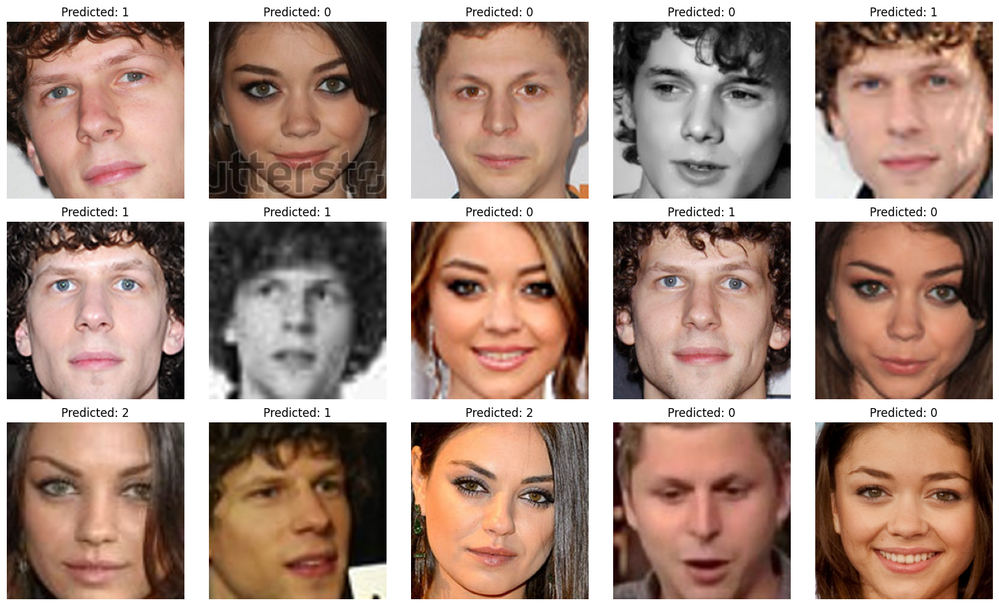

In [50]:
fig, axes = plt.subplots(3, 5, figsize=(15, 9))  # Adjust rows and columns as needed
axes = axes.flatten()

for idx, ax in enumerate(axes):
    if idx >= len(test_X):
        ax.axis('off')
        continue

    img = test_X[idx]
    if img is not None and img.shape[-1] == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ax.imshow(img.astype(np.uint8))
    ax.axis('off')
    ax.set_title(f"Predicted: {submission_df['class'].iloc[idx]}")

plt.tight_layout()
plt.show()

# 6. Discussion

The main things we learned from this project are:
1. The importance of data quality: The quality of the data is crucial for the performance of the model. If the data is not well aligned, the features extracted are not very useful. This is the case even when using pretrained models.

2. The importance of the choice of classifier: The choice of classifier is directly related to the quality of the features extracted. Each classifier has its own biases and assumptions. The choice of classifier is also related to the number of samples you have. For example, if you have a lot of samples, you can use a more complex classifier like a neural network. If you have a small number of samples, you should use a simpler classifier like SVM or KNN. In the case of transfer learing, not many samples are always needed. The problem of overfitting can emerge on pretrained models as well, especially when the model is fine tuned on the train set.

3. At the end of the day, intuition plays a big role in the process. It is purely logical that images that do not contain the class of interest should not be used to train the model. The same goes for images that are not well aligned. The choice of the model is also important. The pretrained InceptionResnetV1 model is a good choice for face recognition tasks, but it is not the only one, since every model that has been trained on a large scale should be able to extract meaningfull features, given the data is correctly aligned. There are many other models that can be used for this task, such as VGGFace2, FaceNet, and OpenFace but also models that have not been specifically trained on faces. The choice of the model depends on the specific task and the data available.

4. Deep learning approaches indeed seem to outperform classical approaches. The classical approaches are not able to learn the features from the data, but rather rely on hand crafted features. This is a big limitation, especially when the data is not well aligned. The deep learning approaches are able to learn the features from the data, which is a big advantage. However, they are also more computationally expensive and require more data to train.

5. Quality wise, even among the deep learning approaches, there are big differences. The pretrained InceptionResnetV1 model outperforms the other models we tried, such as MobileNet and ResNet. This is due to the fact that the InceptionResnetV1 model has been specifically trained on faces, while the other models have been trained on a more general dataset. Of course all of these approaches do perform better than the open-cv approaches.

6. As discussed through the notebook: Performances are sub optimal because of the quality of the data. The images are not well aligned, which leads to poor performance of the models. The models are not able to learn the features from the data, which is a big limitation. The deep learning approaches are able to learn the features from the data, but they are also more computationally expensive and require more data to train. The classical approaches are not able to learn the features from the data, but rather rely on hand crafted features. This is a big limitation, especially when the data is not well aligned. Thankfully this can be fixed with the MTCNN face detector, which is able to detect the faces in the images and align them.

7. Finally, we learned that by using a simpler approach, such as cosine similarity between the embeddings and the class centers, we can achieve good results without the need for a complex classifier. This is due to the fact that the embeddings are already in a high dimensional space, which makes it easier to classify them using simple methods. The choice of the classifier is also important, but it is not the only thing that matters. The quality of the data and the features extracted are also crucial for the performance of the model.
8. Given more time, we would have liked to incorporate more visualization techniques to showcase the data and the features extracted. We would have also liked to try more models and classifiers, such as VGGFace2, FaceNet, and OpenFace. Finally, we would have liked to try more data augmentation techniques to improve the performance of the model.
